# Intracellular Communication Modeling with scMagnify

## Preliminaries

In this tutorial, you will learn how to:

- **Cell-cell Communication analysis with LIANA+** 

- **Infer Dynamic Signaling-to-Transcription Axes.** Correlate receptor expression with intracellular TF activity along a pseudotime trajectory.

---

### Rationale

Intercellular communication via ligand-receptor (L-R) interactions is fundamental to coordinating cellular responses in development and disease. However, a key challenge is understanding how these extracellular signals are dynamically translated into specific **intracellular transcriptional programs** to orchestrate cell state transitions {cite}`placeholder_47, placeholder_90, placeholder_91`.

To address this, `scMagnify` provides a dynamic communication module. This analysis moves beyond simple L-R pairing and aims to connect intercellular signaling (receptors) directly to the **intracellular TF activity** along a defined differentiation trajectory.

Briefly, the workflow first establishes potential ligand-receptor-TF links from a knowledgebase. It then correlates receptor expression with TF activity across metacells ordered by pseudotime. Finally, a permutation test is employed to identify statistically significant and robust signaling-to-transcription axes that change dynamically during the process.

## Import packages

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
from numba.core.errors import NumbaDeprecationWarning
warnings.simplefilter("ignore", category=NumbaDeprecationWarning)
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [3]:
import os
import sys
import numpy as np
import pandas as pd

In [4]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
import scanpy as sc
import decoupler as dc

In [6]:
import liana as li

In [7]:
import scmagnify as scm
from scmagnify.settings import settings
import scmagnify.logging as logg


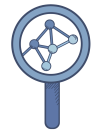

In [8]:
scm.info()

## Configurations

In [9]:
scm.settings.verbosity = 2

In [10]:
%matplotlib inline

scm.settings.set_figure_params(
    dpi=100,
    facecolor="white",
    frameon=False,
) 

scm.load_fonts(["Arial"])

plt.rcParams["font.family"] = "Arial"
plt.rcParams['grid.alpha'] = 0

In [14]:
# Setting a workspace
dirPjtHome = "/mnt/TrueNas/project/chenxufeng/Data/PMID38199997_NatCommun2024"
workDir = os.path.join(dirPjtHome, "scmagnify_wd")
scm.set_workspace(workDir)

workspace: /mnt/TrueNas/project/chenxufeng/Data/PMID38199997_NatCommun2024/scmagnify_wd/
├── data
├── models
├── tmpfiles
└── figures

In [15]:
scm.set_genome(
    version="hg38",
    genomes_dir="/home/chenxufeng/picb_cxf/Ref/human/hg38/"
)

                        Genome Information                        
┏━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Version ┃ Provider ┃ Directory                                 ┃
┡━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ hg38    │ UCSC     │ /home/chenxufeng/picb_cxf/Ref/human/hg38/ │
└─────────┴──────────┴───────────────────────────────────────────┘

## Load the Data

In [16]:
gdata = scm.read(os.path.join(settings.data_dir, "kidney-injury-tal_H11CORE.h5mu"))

/picb/lihonglab/chenxufeng/miniconda3/envs/scm_test/lib/python3.10/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/picb/lihonglab/chenxufeng/miniconda3/envs/scm_test/lib/python3.10/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.


In [17]:
gdata

Gene Regulatory Network (GRN) with 30523 edges.
MuData object with n_obs × n_vars = 8080 × 359416
  uns:	'attention_weights', 'filtered_network', 'motif_scan', 'network', 'peak_gene_corrs', 'regfactors', 'regfactors_colors'
  4 modalities
    RNA:	8080 x 22857
      obs:	'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'experiment', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'Total_fragments', 'FRiP', 'RNA.weight', 'ATAC.weight', 'dpt_pseudotime', 'celltype', 'leiden_res_0.50', 'n_counts', 'SEACell'
      var:	'name', 'n_cells', 'significant_genes', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
      uns:	'celltype_colors', 'celltype_sizes', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.50_sizes', 'library_colors', 'log1p', 'neighbors', 'paga', 'subclass.l1_colors', 'subclass.l2_colors', 'subclass.l2_sizes', 'subclass.l3_colors', 'test_assoc', 'umap'
      obsm:	'X_diffmap', 'X_draw_graph_fa', 'X_lsi', 'X_pca', 'X_phate', 'X_umap', 'padj_mlm', 'score_mlm'
      varm:	'test_assoc_res'
      layers:	'counts', 'log1p_norm'
      obsp:	'connectivities', 'distances'
    ATAC:	8080 x 336500
      obs:	'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'experiment', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'Total_fragments', 'FRiP', 'RNA.weight', 'ATAC.weight', 'SEACell'
      var:	'count', 'percentile', 'AA', 'AC', 'AG', 'AT', 'CA', 'CC', 'CG', 'CT', 'GA', 'GC', 'GG', 'GT', 'TA', 'TC', 'TG', 'TT', 'GC.percent', 'sequence.length'
      uns:	'library_colors', 'neighbors', 'peak_seq', 'subclass.l2_colors', 'subclass.l3_colors', 'umap'
      obsm:	'X_lsi', 'X_pca', 'X_svd', 'X_umap'
      layers:	'counts'
      obsp:	'connectivities', 'distances'
    GRN:	8080 x 54
      obs:	'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'experiment', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'Total_fragments', 'FRiP', 'RNA.weight', 'ATAC.weight', 'dpt_pseudotime', 'celltype', 'leiden_res_0.50', 'n_counts', 'SEACell'
      var:	'mean_activity'
      uns:	'basal_grn', 'celltype_colors', 'celltype_sizes', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.50_sizes', 'library_colors', 'log1p', 'neighbors', 'paga', 'subclass.l1_colors', 'subclass.l2_colors', 'subclass.l2_sizes', 'subclass.l3_colors', 'test_assoc', 'umap'
      obsm:	'X_diffmap', 'X_draw_graph_fa', 'X_lsi', 'X_pca', 'X_phate', 'X_umap', 'padj_mlm', 'score_mlm'
      varm:	'network_score'
    RegFactor:	8080 x 5
      obs:	'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'experiment', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'Total_fragments', 'FRiP', 'RNA.weight', 'ATAC.weight', 'dpt_pseudotime', 'celltype', 'leiden_res_0.50', 'n_counts', 'SEACell'
      uns:	'celltype_colors', 'celltype_sizes', 'diffmap_evals', 'draw_graph', 'hvg', 'iroot', 'leiden_res_0.50', 'leiden_res_0.50_colors', 'leiden_res_0.50_sizes', 'library_colors', 'log1p', 'neighbors', 'paga', 'subclass.l1_colors', 'subclass.l2_colors', 'subclass.l2_sizes', 'subclass.l3_colors', 'test_assoc', 'umap'
      obsm:	'X_diffmap', 'X_draw_graph_fa', 'X_lsi', 'X_pca', 'X_phate', 'X_umap', 'padj_mlm', 'score_mlm'
      varm:	'Lag_loadings', 'TF_loadings', 'TG_loadings'

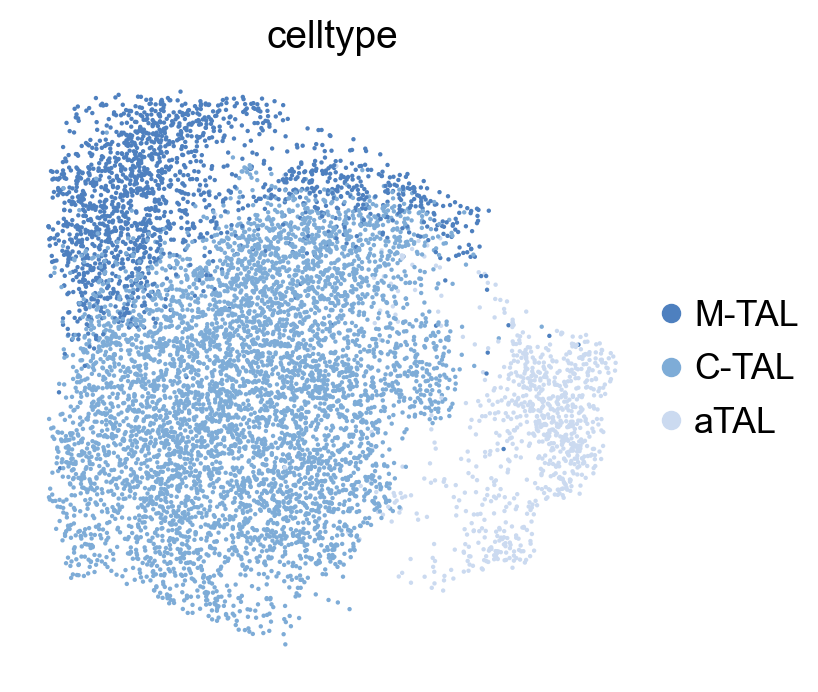

In [20]:
sc.pl.umap(
    gdata["RNA"],
    color=["celltype"],
    size=10,
    frameon=False,
)

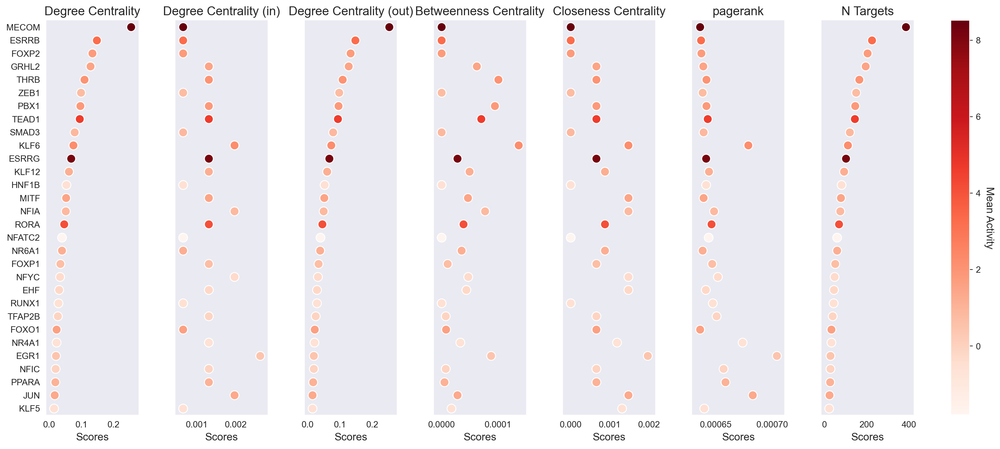

In [23]:
scm.pl.stripplot(gdata, sortby="degree_centrality", n_top=30)

In [25]:
adata_cci = sc.read("/mnt/TrueNas/project/chenxufeng/Data/PMID38199997_NatCommun2024/1_AnnData/kidney-injury-rna_tal_imm.h5ad")

In [26]:
adata_cci

AnnData object with n_obs × n_vars = 12813 × 36554
    obs: 'nCount_RNA', 'nFeature_RNA', 'library', 'percent.er', 'percent.mt', 'experiment', 'subclass.l3', 'subclass.l2', 'subclass.l1', 'nCount_ATAC', 'nFeature_ATAC', 'nucleosome_signal', 'nucleosome_percentile', 'TSS.enrichment', 'TSS.percentile', 'Total_fragments', 'FRiP', 'RNA.weight', 'ATAC.weight', 'celltype_hierarchical', 'celltype'
    var: 'name'
    uns: 'celltype_colors', 'dendrogram_celltype_hierarchical', 'library_colors', 'log1p', 'neighbors', 'subclass.l1_colors', 'subclass.l2_colors', 'subclass.l3_colors', 'umap'
    obsm: 'X_lsi', 'X_pca', 'X_umap'
    layers: 'log1p_norm'
    obsp: 'connectivities', 'distances'

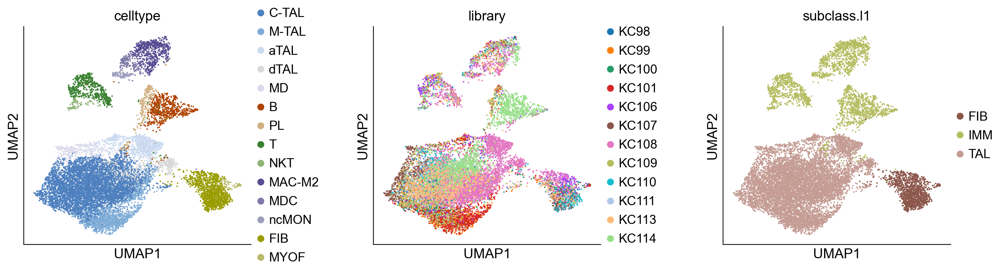

In [27]:
sc.pl.umap(adata_cci, color=["celltype", "library", "subclass.l1"], wspace=0.4, ncols=3)

In [28]:
meta_mdata = scm.read(os.path.join(settings.data_dir, "kidney-injury-tal_metacells.h5mu"))
meta_mdata["RNA"].layers["log1p_norm"] = meta_mdata["RNA"].X.copy()

## RegFactor Analysis

/home/chenxufeng/WorkSpace/Git-repos/scMagnify/src/scmagnify/plotting/_barplot.py:137: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


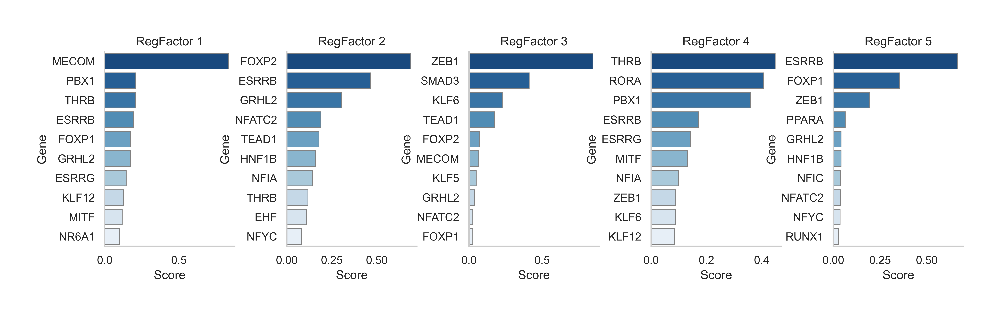

In [52]:
scm.pl.barplot(
    gdata,
    modal="RegFactor",
    key="TF_loadings",
    swap_df=True,
    n_top=10,
    ncols=5,
    cmap="Blues_r",
)

/home/chenxufeng/WorkSpace/Git-repos/scMagnify/src/scmagnify/plotting/_barplot.py:137: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


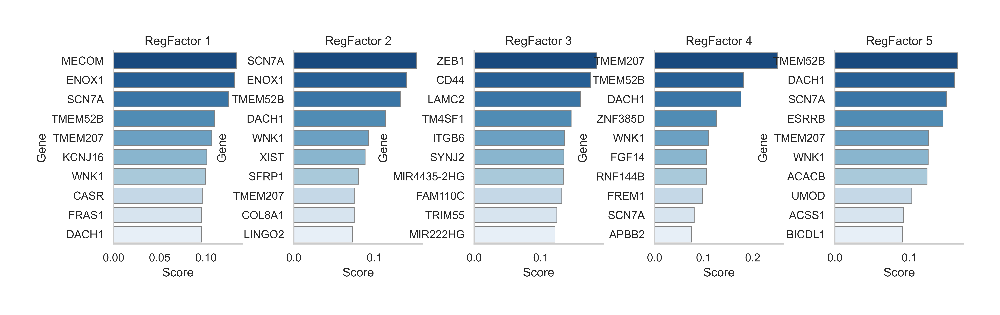

In [58]:
scm.pl.barplot(
    gdata,
    modal="RegFactor",
    key="TG_loadings",
    swap_df=True,
    n_top=10,
    ncols=5,
    cmap="Blues_r",
)

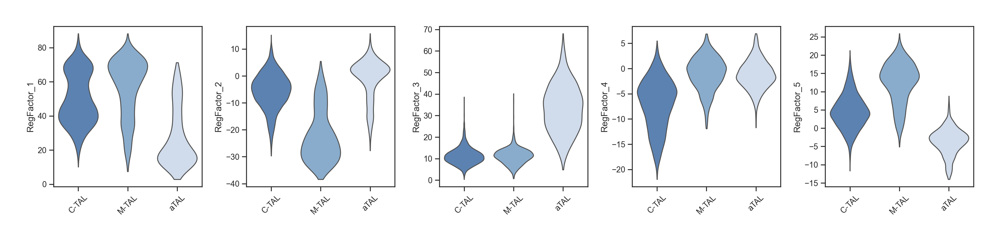

In [57]:
sc.pl.violin(
    gdata["RegFactor"], 
    keys=gdata["RegFactor"].var_names, 
    groupby="celltype", 
    rotation=45, 
    stripplot=False,
    show=True
)

## Cell-cell Communication with Liana+

In [29]:
li.mt.cellchat(adata_cci,
         groupby="celltype",
         resource_name="cellchatdb",
         verbose=True,
         use_raw=False,
         layer="log1p_norm",
         key_added="cellchat_res")

cellchat_res = adata_cci.uns["cellchat_res"].copy()

2025-10-28 09:43:19 | [INFO] Using resource `cellchatdb`.
2025-10-28 09:43:19 | [INFO] Using the `log1p_norm` layer!
2025-10-28 09:43:19 | [INFO] Converting to sparse csr matrix!
2025-10-28 09:43:19 | [WARNING] 3795 features of mat are empty, they will be removed.
/picb/lihonglab/chenxufeng/miniconda3/envs/scm_test/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:150: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
2025-10-28 09:43:21 | [INFO] 0.06 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 12813 samples and 878 features


100%|██████████| 1000/1000 [02:41<00:00,  6.20it/s]


In [32]:
from scmagnify.external.plotting.liana import LianaVisualizer

In [33]:
lvis = LianaVisualizer(adata_cci, res_key="cellchat_res", 
                       magnitude_col="lr_probs",
                       pvalue_col="cellchat_pvals", 
                       cluster_key="celltype")

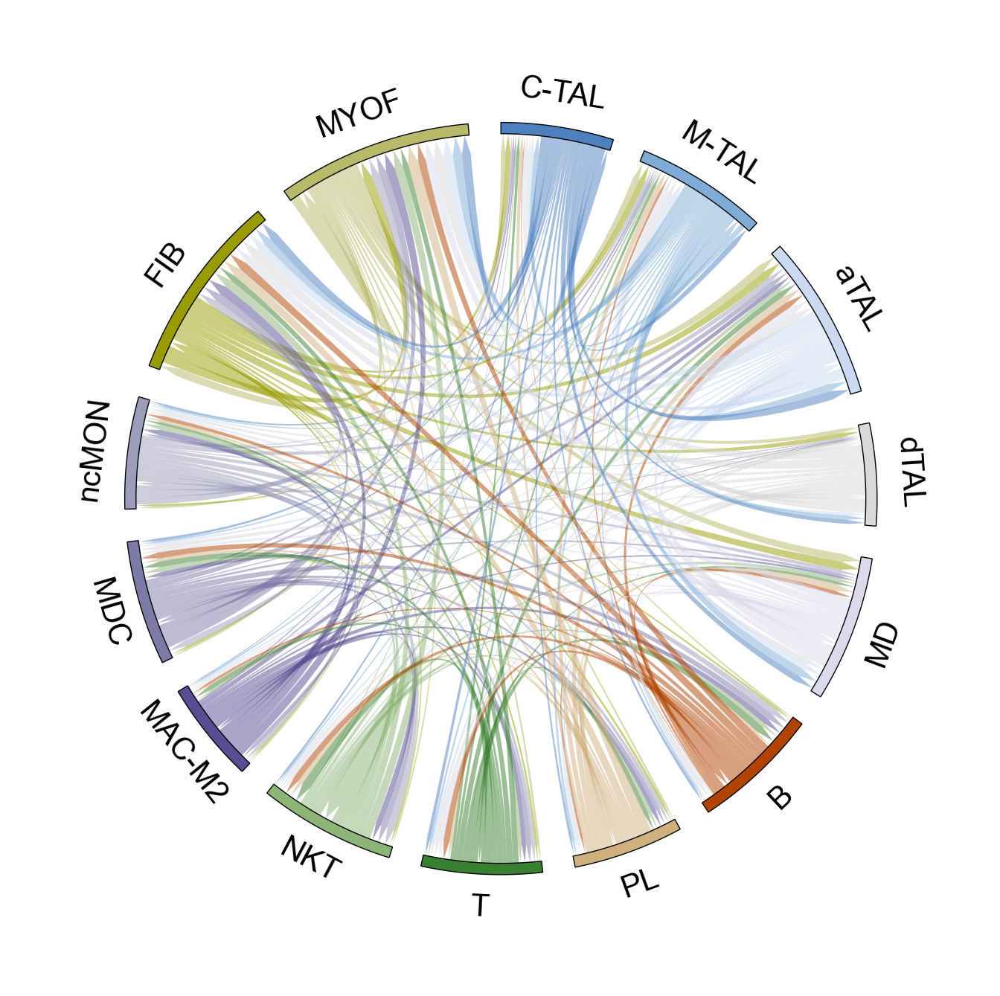

In [34]:
fig = lvis.plot_chord(
    kind="count", normalize="row", 
    link_kws=dict(ec="black", lw=0, direction=1),
    label_kws=dict(size=15)
)

/home/chenxufeng/WorkSpace/Git-repos/scMagnify/src/scmagnify/external/plotting/liana.py:557: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


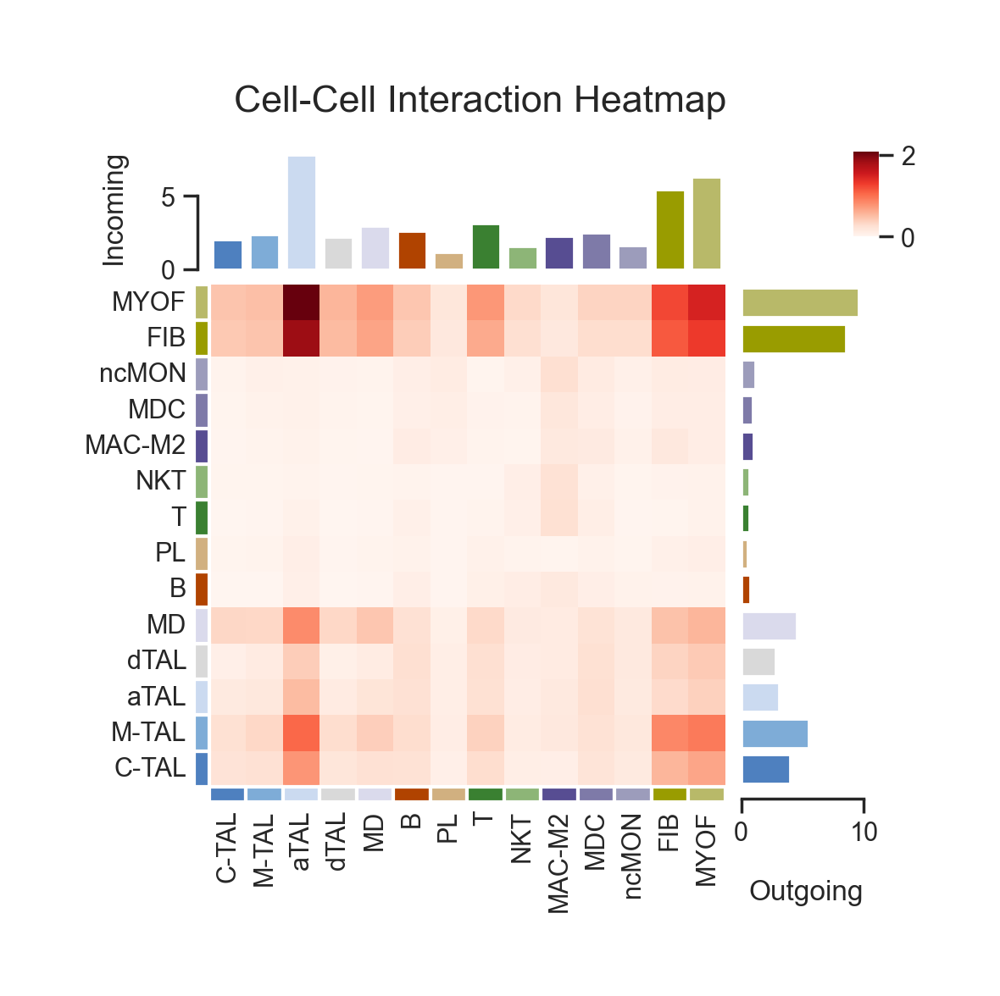

In [35]:
fig, ax = lvis.plot_interact_heatmap(cmap="Reds")

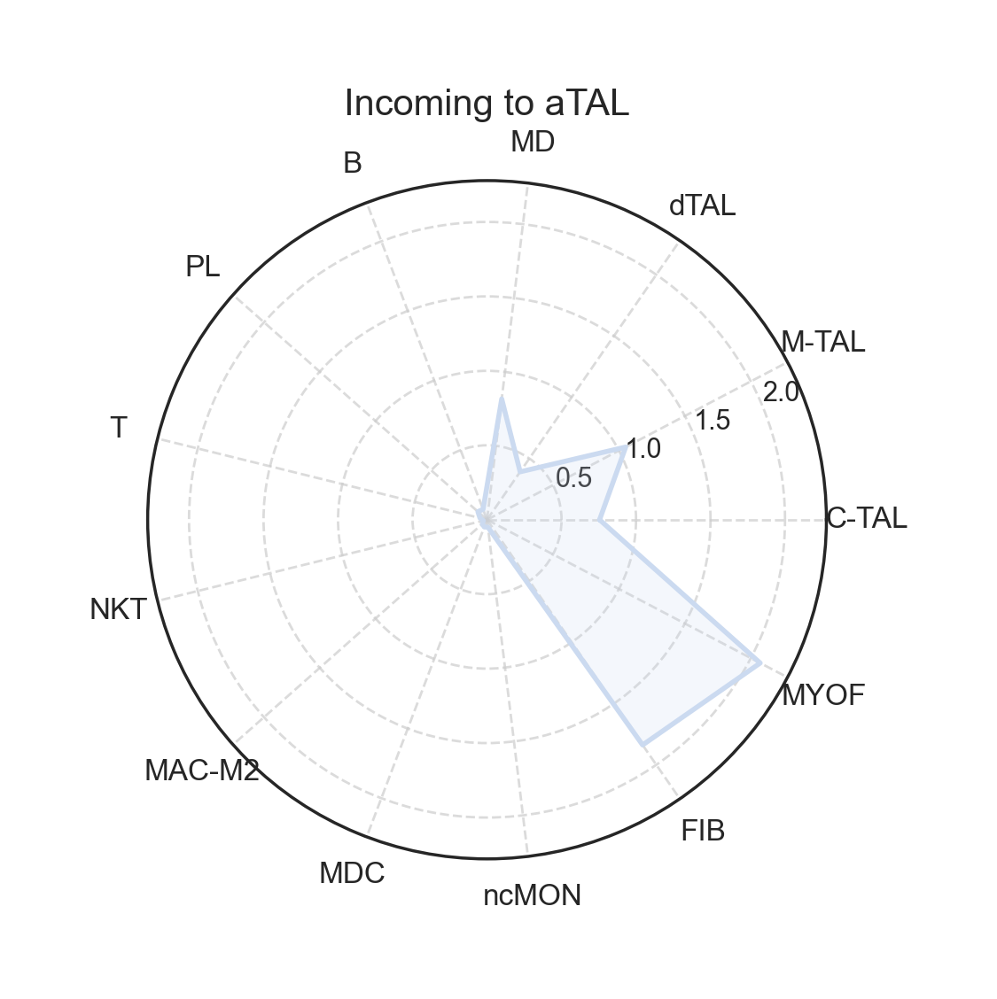

In [36]:
fig, ax = lvis.plot_radar(cell="aTAL", mode="incoming", kind="strength")

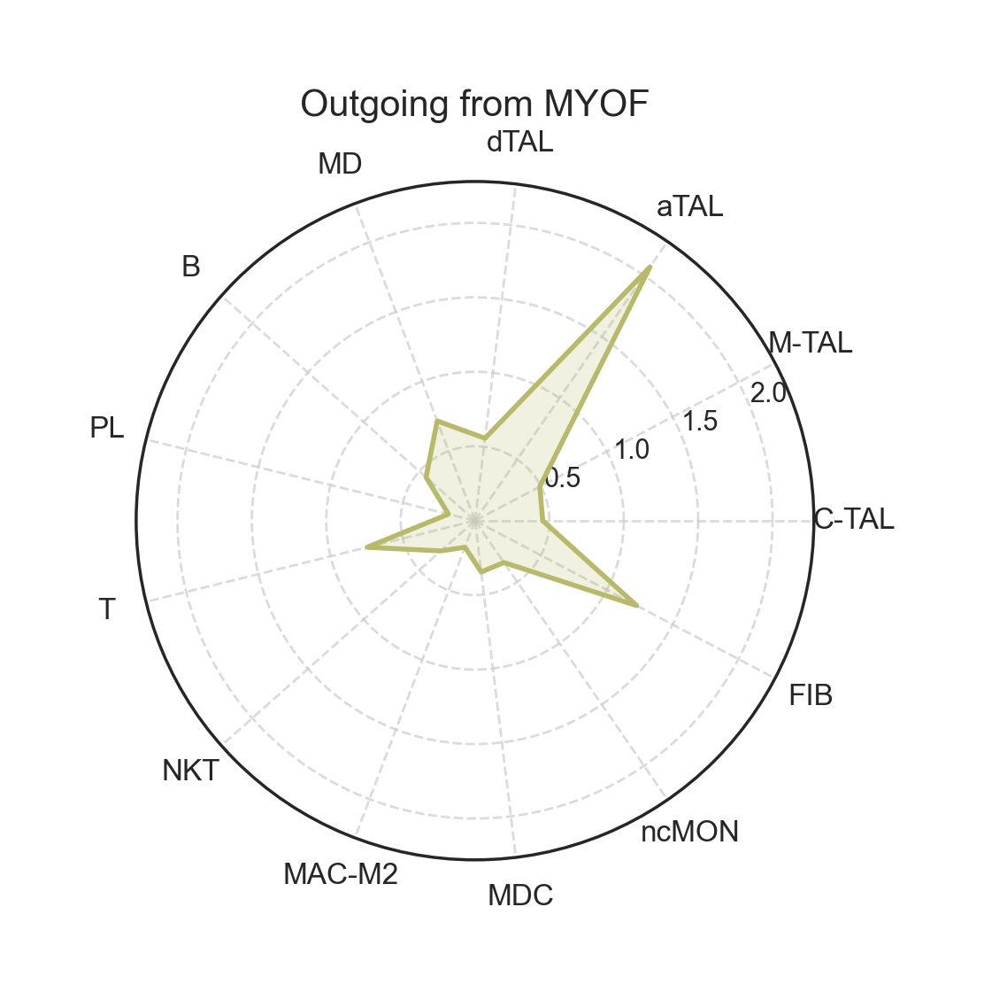

In [37]:
fig, ax = lvis.plot_radar(cell="MYOF", mode="outgoing", kind="strength")

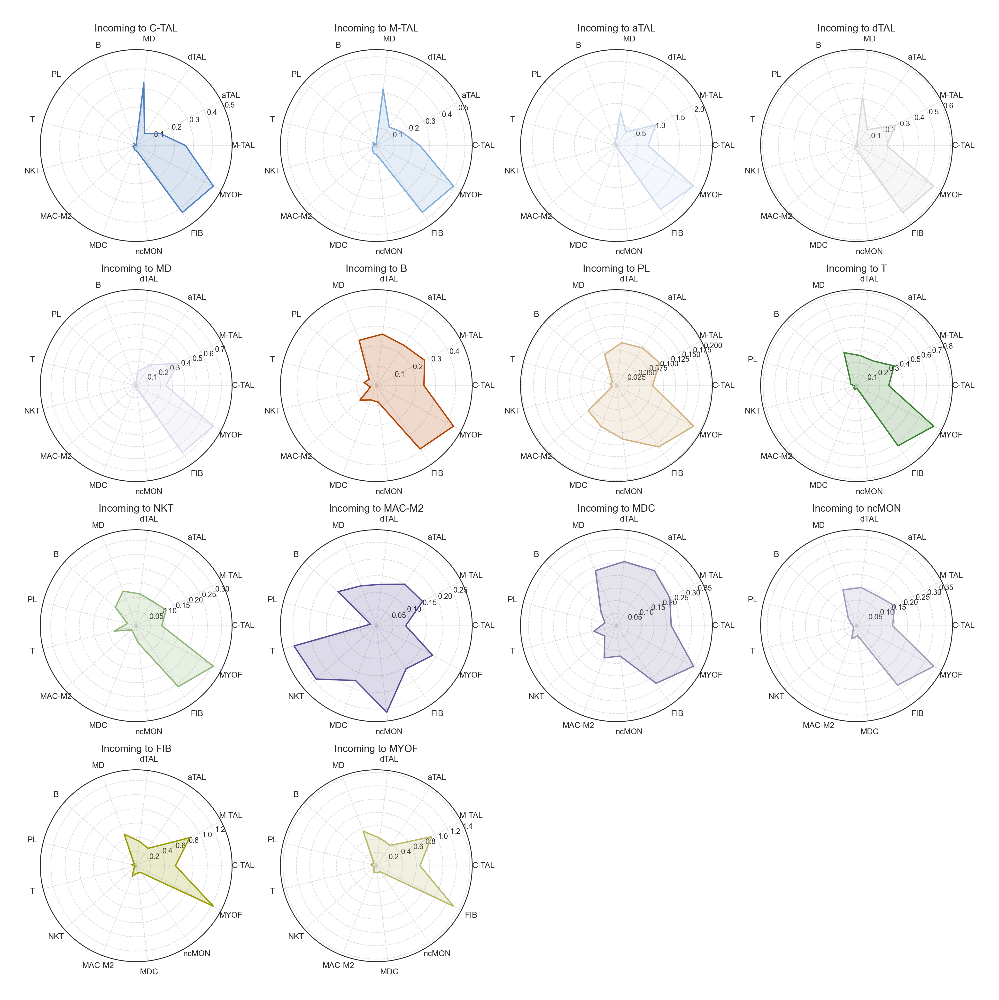

In [38]:
fig, ax = lvis.plot_radar(mode="incoming", kind="strength")

## Intracellular Communication

In [39]:
merged_df = scm.tl.infer_signal_pairs(
            gdata,
            meta_mdata,
            liana_res=cellchat_res,
            rtf_prior_net="combined_RTF",
            target_celltypes=["aTAL", "C-TAL", "M-TAL"],
        )

INFO     Starting Receptor-TF downstream analysis...

INFO     Loading built-in RTF network: 'combined_RTF'

INFO     Filtering prior network for 68 receptors and 54 TFs.

WARNING  WARNING: 'dpt_pseudotime' not found in `meta_mdata`. Calculating from `data`...

INFO     Ordering 107 metacells by 'dpt_pseudotime'.

INFO     Calculating original scores for 834 R-T pairs.

INFO     Performing permutation test with 1000 permutations...

INFO     Calculating p-values and adjusting for multiple testing.

          Receptor-TF Downstream Analysis Summary          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃                                          Metric ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│                        Tested Receptor-TF pairs │ 834   │
│ Significant pairs (by covariance, adj p < 0.05) │ 301   │
└─────────────────────────────────────────────────┴───────┘

INFO     Analysis complete.

In [40]:
source_celltypes = ["MAC-M2", "MDC", "ncMON", "NKT", "PL", "T", "B", "FIB", "MYOF"]
source_imm = ["MAC-M2", "MDC", "ncMON", "NKT", "PL", "T", "B"]
source_fib = ["FIB", "MYOF"]

In [41]:
merged_df_fil_imm = merged_df[(merged_df["pval_cov_adj"] < 0.01) & (merged_df["cellchat_pvals"] < 0.01) &  
                          (merged_df["source"].isin(source_imm)) &
                          (merged_df["target"] == "aTAL")]


merged_df_fil_fib = merged_df[(merged_df["pval_cov_adj"] < 0.01) & (merged_df["cellchat_pvals"] < 0.01) &
                            (merged_df["source"].isin(source_fib)) &
                            (merged_df["target"] == "aTAL")]

In [42]:
merged_df_fil_imm

,signal_pairs,ligand_receptor,receptor,TF,dot_product,covariance,pval_dot,pval_cov,pval_dot_adj,pval_cov_adj,...,ligand_props,ligand_trimean,mat_max,receptor_complex,receptor_props,receptor_trimean,source,target,lr_probs,cellchat_pvals
31,SPP1-CD44-ZEB1,SPP1-CD44,CD44,ZEB1,5.764141,1.262087,0.000999,0.000999,0.003967,0.003967,...,0.403226,0.069604,7.855748,CD44,0.398593,0.067263,T,aTAL,0.009277,0.0
32,SPP1-CD44-ZEB1,SPP1-CD44,CD44,ZEB1,5.764141,1.262087,0.000999,0.000999,0.003967,0.003967,...,0.443750,0.064268,7.855748,CD44,0.398593,0.067263,MDC,aTAL,0.008572,0.0
37,SPP1-CD44-ZEB1,SPP1-CD44,CD44,ZEB1,5.764141,1.262087,0.000999,0.000999,0.003967,0.003967,...,0.376344,0.056561,7.855748,CD44,0.398593,0.067263,ncMON,aTAL,0.007551,0.0
39,SPP1-CD44-ZEB1,SPP1-CD44,CD44,ZEB1,5.764141,1.262087,0.000999,0.000999,0.003967,0.003967,...,0.366412,0.053767,7.855748,CD44,0.398593,0.067263,MAC-M2,aTAL,0.007181,0.0
40,SPP1-CD44-ZEB1,SPP1-CD44,CD44,ZEB1,5.764141,1.262087,0.000999,0.000999,0.003967,0.003967,...,0.349131,0.052891,7.855748,CD44,0.398593,0.067263,B,aTAL,0.007065,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20400,IGF1-IGF1R-PPARA,IGF1-IGF1R,IGF1R,PPARA,18.289663,0.027069,0.000999,0.000999,0.003967,0.003967,...,0.273092,0.028645,7.855748,IGF1R,0.623681,0.180689,PL,aTAL,0.010246,0.0
21523,BMP6-BMPR1A-TCF7L2,BMP6-BMPR1A,BMPR1A,TCF7L2,15.832006,0.021230,0.000999,0.000999,0.003967,0.003967,...,0.253012,0.012410,7.855748,BMPR1A_BMPR2,0.318875,0.037661,PL,aTAL,0.000934,0.0
21917,IGF1-IGF1R-NFIA,IGF1-IGF1R,IGF1R,NFIA,19.676503,0.021143,0.000999,0.000999,0.003967,0.003967,...,0.273092,0.028645,7.855748,IGF1R,0.623681,0.180689,PL,aTAL,0.010246,0.0
22501,IGF1-IGF1R-THRB,IGF1-IGF1R,IGF1R,THRB,21.584236,0.015595,0.000999,0.000999,0.003967,0.003967,...,0.273092,0.028645,7.855748,IGF1R,0.623681,0.180689,PL,aTAL,0.010246,0.0


## Visualization

In [43]:
imm_tf_list = merged_df_fil_imm["TF"].value_counts()[merged_df_fil_imm["TF"].value_counts() > 10].index.tolist()
fib_tf_list = merged_df_fil_fib["TF"].value_counts()[merged_df_fil_fib["TF"].value_counts() > 10].index.tolist()

union_tf_list = list(set(imm_tf_list) | set(fib_tf_list))

In [44]:
union_tf_list

['KLF5',
 'MBD2',
 'ELF3',
 'NR4A1',
 'ZEB1',
 'TCF12',
 'NFE2L2',
 'ETS1',
 'TEAD1',
 'JUN',
 'STAT3',
 'RUNX1',
 'EPAS1',
 'SMAD3',
 'SOX4',
 'KLF6',
 'EGR1',
 'HIF1A']

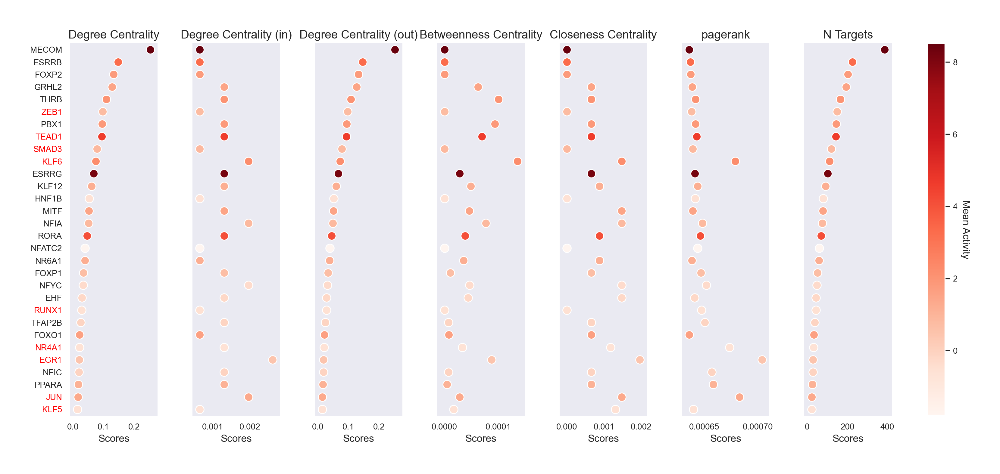

In [46]:
scm.pl.stripplot(
    gdata,
    sortby="degree_centrality", 
    n_top=30,
    selected_genes=union_tf_list,
)

In [47]:
imm_receptor_list = merged_df_fil_imm["receptor"].value_counts()[merged_df_fil_imm["receptor"].value_counts() > 10].index.tolist()
fib_receptor_list = merged_df_fil_fib["receptor"].value_counts()[merged_df_fil_fib["receptor"].value_counts() > 10].index.tolist()

union_receptor_list = list(set(imm_receptor_list) | set(fib_receptor_list))

In [48]:
union_receptor_list

['ITGAV', 'FGFR1', 'CD44', 'ITGB1', 'SDC4', 'ITGA3', 'INSR', 'MET', 'ITGA6']

In [49]:
imm_ligand_list = merged_df_fil_imm["ligand"].value_counts()[merged_df_fil_imm["ligand"].value_counts() > 10].index.tolist()
fib_ligand_list = merged_df_fil_fib["ligand"].value_counts()[merged_df_fil_fib["ligand"].value_counts() > 10].index.tolist()

union_ligand_list = list(set(imm_ligand_list) | set(fib_ligand_list))

In [50]:
union_ligand_list

['COL1A1',
 'COL6A2',
 'COL6A1',
 'COL6A3',
 'FN1',
 'LAMA4',
 'NCAM1',
 'THBS1',
 'LAMC3',
 'COL4A4',
 'LAMA2',
 'COL4A1',
 'HGF',
 'NAMPT',
 'LAMC1',
 'COL4A5',
 'COL1A2',
 'SPP1',
 'COL4A3',
 'COL4A2',
 'LAMB1',
 'LAMA3']

In [51]:
tf_list = ["TEAD1", "ZEB1", "KLF6", "SMAD3", "EGR1", "KLF5", "RUNX1"]
receptor_list = ["CD44", "ITGAV", "ITGA3", "ITGA6", "ITGB8", "SDC4", "FGFR1"]
ligand_list = ["SPP1", "COL1A1", "COL6A1", "COL4A3", "COL4A4", "LAMC1", "LAMA2", "FN1", "THBS1", "NCAM1"]

In [36]:
tf_score = gdata["GRN"].varm["network_score"].copy()

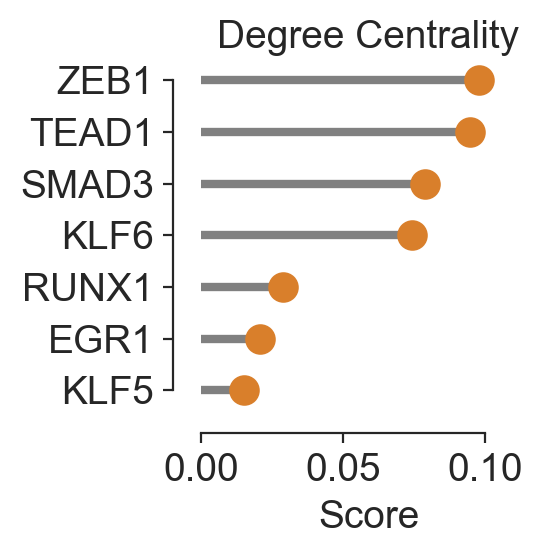

In [37]:
sns.set_style("ticks")

lollipop_plot_df = tf_score.loc[tf_list].copy()
lollipop_plot_df = lollipop_plot_df.sort_values(by="degree_centrality", ascending=False)
sorted_tf_list = lollipop_plot_df.index.tolist()

tf_names = lollipop_plot_df.index[::-1].tolist()
scores = lollipop_plot_df["degree_centrality"].values[::-1]

fig, ax = plt.subplots(figsize=(3, 3))

ax.hlines(y=tf_names, xmin=0, xmax=scores, color="gray", linewidth=3)

ax.plot(scores, tf_names, "o", color="#D97F2B", markersize=10)

ax.set_xlabel("Score")
ax.set_xlim(0, max(scores) + 0.02)
ax.set_title("Degree Centrality")

sns.despine(offset=10, trim=True)
plt.tight_layout()

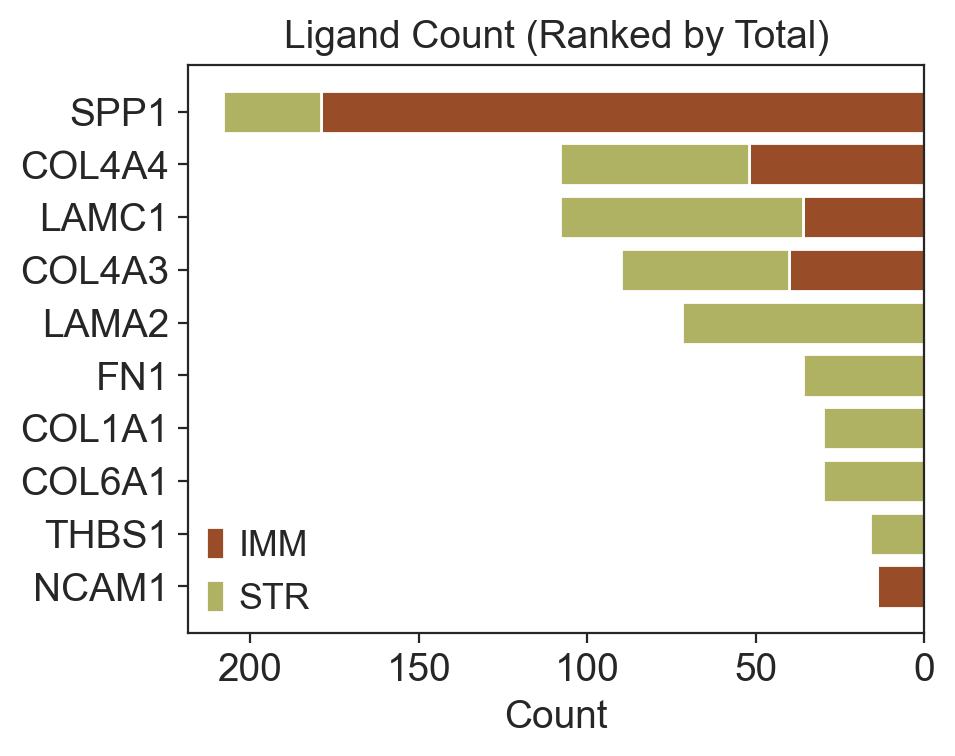

In [38]:
imm_counts_df = merged_df_fil_imm["ligand"].value_counts()
str_counts_df = merged_df_fil_fib["ligand"].value_counts()

counts_df = pd.concat([imm_counts_df, str_counts_df], axis=1)
counts_df.columns = ['IMM', 'STR']


filtered_df = counts_df.reindex(ligand_list).fillna(0)
filtered_df['Total'] = filtered_df['IMM'] + filtered_df['STR']
sorted_df = filtered_df.sort_values(by='Total', ascending=False)
sorted_ligand_list = sorted_df.index.tolist()

fig, ax = plt.subplots(figsize=(5, 4))
y_pos = range(len(sorted_df.index))

ax.barh(y_pos, sorted_df['IMM'], color="#984D28", label="IMM")
ax.barh(y_pos, sorted_df['STR'], left=sorted_df['IMM'], color="#B0B263", label="STR")


ax.set_yticks(y_pos)
ax.set_yticklabels(sorted_df.index) 
ax.invert_yaxis()  
ax.invert_xaxis()  
ax.set_xlabel("Count")
ax.set_title("Ligand Count (Ranked by Total)")
ax.legend()

plt.tight_layout()
plt.show()


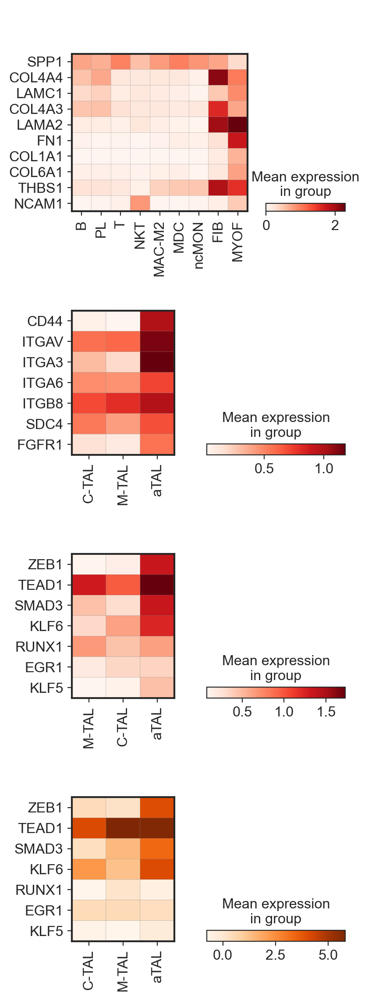

In [39]:
fig, ax = plt.subplots(4, 1, figsize=(4, 14))

sc.pl.matrixplot(adata_cci[~(adata_cci.obs["subclass.l1"] == "TAL")],
              var_names=sorted_ligand_list,
              groupby="celltype",
              cmap="Reds",
              swap_axes=True,
              show=False,
              ax=ax[0],
              use_raw=False)

sc.pl.matrixplot(adata_cci[(adata_cci.obs["subclass.l1"] == "TAL") & (adata_cci.obs["celltype"].isin(["C-TAL", "M-TAL", "aTAL"]) )],
              var_names=receptor_list,
              groupby="celltype",
              cmap="Reds",
              swap_axes=True,
              show=False,
              ax=ax[1],
              use_raw=False)

sc.pl.matrixplot(gdata["RNA"],
              layer="log1p_norm",
              var_names=sorted_tf_list,
              groupby="celltype",
              cmap="Reds",
              swap_axes=True,
              show=False,
              ax=ax[2],
              use_raw=False)

sc.pl.matrixplot(gdata["GRN"],
              var_names=sorted_tf_list,
              groupby="celltype",
              cmap="Oranges",
              swap_axes=True,
              ax=ax[3],
              use_raw=False)


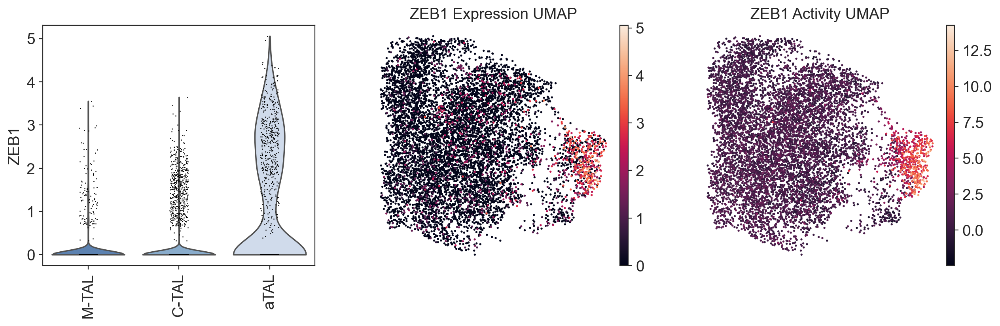

In [40]:
tf = "ZEB1"
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
sc.pl.violin(gdata["RNA"], tf, groupby="celltype", rotation=90, layer="log1p_norm", use_raw=False, ax=ax[0], show=False)
sc.pl.umap(gdata["RNA"], color=tf, use_raw=False, frameon=False, ax=ax[1], show=False, title=f"{tf} Expression UMAP")
sc.pl.umap(gdata["GRN"], color=tf, use_raw=False, frameon=False, ax=ax[2], show=True, title=f"{tf} Activity UMAP")

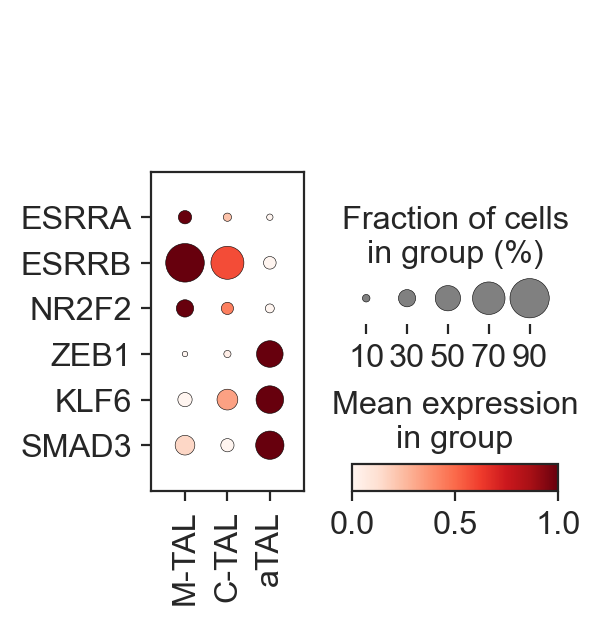

In [41]:
sc.pl.dotplot(
    gdata["RNA"],
    var_names=["ESRRA", "ESRRB", "NR2F2", "ZEB1", "KLF6", "SMAD3"],
    groupby="celltype",
    standard_scale="var",
    cmap="Reds",
    swap_axes=True,
)

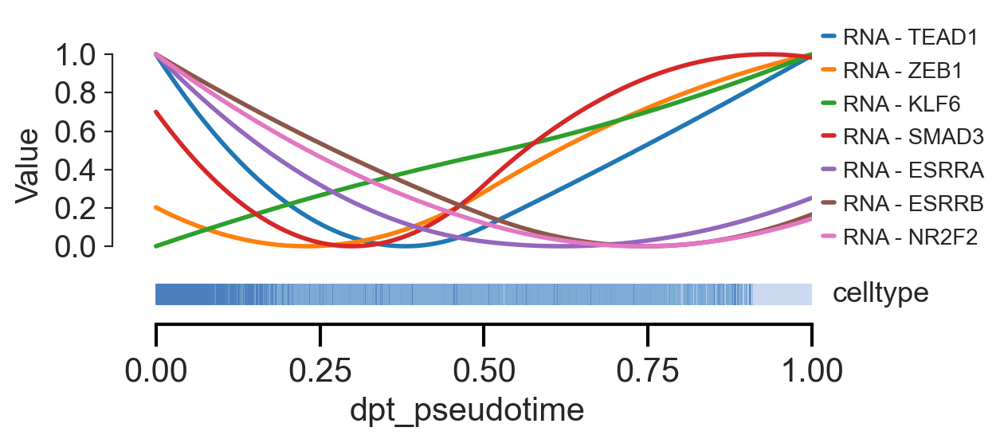

<Axes: xlabel='dpt_pseudotime', ylabel='Value'>

In [42]:
sns.set_style("ticks")
scm.pl.trendplot(
    gdata,
    var_dict = {
        "TEAD1": ["RNA"],
        "ZEB1": ["RNA"],
        "KLF6": ["RNA"],
        "SMAD3": ["RNA"],
        "ESRRA": ["RNA"],
        "ESRRB": ["RNA"],
        "NR2F2": ["RNA"],
    },
    normalize = True,
    sortby = "dpt_pseudotime",
    col_color = ["celltype"],
    figsize=(6.5, 3),
    n_splines=4,
    show_tkey=False,
    swap_x=False,
    show_stds=False,
)

In [43]:
filtered_df = merged_df[(merged_df["ligand"].isin(sorted_ligand_list)) & 
          (merged_df["receptor"].isin(receptor_list)) & 
          (merged_df["TF"].isin(sorted_tf_list)) & 
          (merged_df["source"].isin(source_celltypes)) & 
          (merged_df["target"] == "aTAL")]


lr_agg_df = filtered_df.groupby(["ligand", "receptor"]).agg(lr_probs=('lr_probs', 'sum')).reset_index().sort_values(by="lr_probs", ascending=False)
rtf_agg_df = filtered_df.groupby(["receptor", "TF"]).agg(rtf_covs=('covariance', 'mean')).reset_index().sort_values(by="rtf_covs", ascending=False)


In [44]:
celltype_order = ["M-TAL", "C-TAL", "aTAL"]
gdata["RNA"].obs["celltype"] = pd.Categorical(gdata["RNA"].obs["celltype"], categories=celltype_order, ordered=True)
gdata["GRN"].obs["celltype"] = pd.Categorical(gdata["GRN"].obs["celltype"], categories=celltype_order, ordered=True)

In [45]:
celltype_order = ["M-TAL", "C-TAL", "aTAL", "dTAL", "MD", "B", "PL", "T", "NKT", "MAC-M2",
       "MDC", "ncMON", "FIB", "MYOF"]
adata_cci.obs["celltype"] = pd.Categorical(adata_cci.obs["celltype"], categories=celltype_order, ordered=True)

2025-10-09 16:25:18 | [INFO] maxp pruned
2025-10-09 16:25:18 | [INFO] LTSH dropped
2025-10-09 16:25:18 | [INFO] cmap pruned
2025-10-09 16:25:18 | [INFO] kern pruned
2025-10-09 16:25:18 | [INFO] post pruned
2025-10-09 16:25:18 | [INFO] PCLT dropped
2025-10-09 16:25:18 | [INFO] DSIG dropped
2025-10-09 16:25:18 | [INFO] glyf pruned
2025-10-09 16:25:18 | [INFO] Added gid0 to subset
2025-10-09 16:25:18 | [INFO] Added first four glyphs to subset
2025-10-09 16:25:18 | [INFO] Closing glyph list over 'glyf': 59 glyphs before
2025-10-09 16:25:18 | [INFO] Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'R', 'S', 'T', 'U', 'V', 'X', 'Y', 'Z', 'a', 'b', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'hyphen', 'i', 'k', 'l', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'parenleft', 'parenright', 'period', 'r', 's', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'v', 'x', 'y', 'zero']
2025-10-09 16:25:18 | [INFO] Glyph IDs:   [0, 1, 2, 3, 11

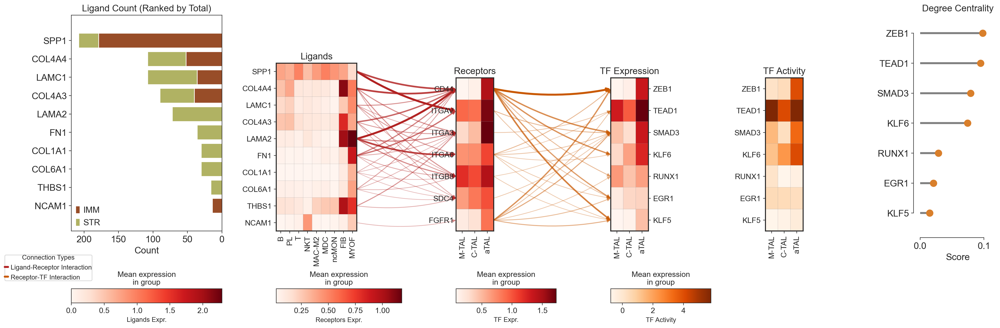

In [46]:
# Import necessary libraries
from matplotlib.patches import ConnectionPatch
import matplotlib.gridspec as gridspec

# --- Assume these data objects are already loaded in your environment ---
# adata_cci = ...
# gdata = ...
# sorted_ligand_list = ['SPP1', ...]  # Example gene
# receptor_list = ['CD44', ...]     # Example gene
# sorted_tf_list = ['STAT3', ...]      # Example TF

# =============================================================================
# 1. Setup a custom figure layout for THREE plots
# =============================================================================
# Create the main figure (the "canvas"), making it wider for three plots
fig = plt.figure(figsize=(25, 8))

# Define a 2-row, 3-COLUMN grid. The top row for plots is much taller.
gs = gridspec.GridSpec(2, 6, wspace=0.5, hspace=0.5, width_ratios=[6, 5, 4, 4, 4, 3], height_ratios=[15, 1])

# Create three axes for the main plots in the top row
axes = [fig.add_subplot(gs[0, 0]), 
        fig.add_subplot(gs[0, 1]), 
        fig.add_subplot(gs[0, 2]), 
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[0, 4]),
        fig.add_subplot(gs[0, 5])]

# ax_tf_activity = axes[3]
# ax_lollipop = fig.add_subplot(gs[0, 4])
# axes.append(ax_lollipop)
ax_ligand_barh = axes[0]
ax_lollipop = axes[5]

legend_axes = [fig.add_subplot(gs[1, 0]),
                fig.add_subplot(gs[1, 1]),
                fig.add_subplot(gs[1, 2]),
                fig.add_subplot(gs[1, 3])]

# =============================================================================
# 2. Draw the three matrixplots
# =============================================================================

# Plot 0: Ligand count barplot

filtered_df = counts_df.reindex(ligand_list).fillna(0)
filtered_df['Total'] = filtered_df['IMM'] + filtered_df['STR']
sorted_df = filtered_df.sort_values(by='Total', ascending=False)
sorted_ligand_list = sorted_df.index.tolist()

y_pos = range(len(sorted_df.index))
ax_ligand_barh.barh(y_pos, sorted_df['IMM'], color="#984D28", label="IMM")
ax_ligand_barh.barh(y_pos, sorted_df['STR'], left=sorted_df['IMM'], color="#B0B263", label="STR")
ax_ligand_barh.set_yticks(y_pos)
ax_ligand_barh.set_yticklabels(sorted_df.index)
ax_ligand_barh.invert_yaxis()
ax_ligand_barh.invert_xaxis()
ax_ligand_barh.set_xlabel("Count")
ax_ligand_barh.set_title("Ligand Count (Ranked by Total)")
ax_ligand_barh.legend()
# Remove y-axis labels from the first plot for a cleaner look
ax_ligand_barh.set_ylabel('')
ax_ligand_barh.margins(y=0.1)

# --- Plot 1: Ligands ---
plot_dict_ligand = sc.pl.matrixplot(adata_cci[~(adata_cci.obs["subclass.l1"] == "TAL")],
                                     var_names=sorted_ligand_list,
                                     groupby="celltype",
                                     cmap="Reds",
                                     swap_axes=True,
                                     show=False,
                                     ax=axes[1],
                                     use_raw=False)
ax_ligand = plot_dict_ligand['mainplot_ax']
ax_ligand.set_title("Ligands")
# Remove y-axis labels from the first plot for a cleaner look
ax_ligand.set_ylabel('')

# --- Plot 2: Receptors ---
plot_dict_receptor = sc.pl.matrixplot(adata_cci[(adata_cci.obs["subclass.l1"] == "TAL") & (adata_cci.obs["celltype"].isin(["M-TAL", "C-TAL", "aTAL"]))],
                                        var_names=receptor_list,
                                        groupby="celltype",
                                        cmap="Reds", # Changed cmap for visual distinction
                                        swap_axes=True,
                                        show=False,
                                        ax=axes[2],
                                        use_raw=False)
ax_receptor = plot_dict_receptor['mainplot_ax']
ax_receptor.set_title("Receptors")
# Remove y-axis labels and ticks from the middle plot
ax_receptor.set_ylabel('')
ax_receptor.tick_params(axis='y', length=0)


# --- Plot 3: Transcription Factors (TF) Expression---
plot_dict_tf = sc.pl.matrixplot(gdata["RNA"],
                                 layer="log1p_norm",
                                 var_names=sorted_tf_list,
                                 groupby="celltype",
                                 cmap="Reds", # Changed cmap for visual distinction
                                 swap_axes=True,
                                 show=False,
                                 ax=axes[3],
                                 use_raw=False)
ax_tf = plot_dict_tf['mainplot_ax']
ax_tf.set_title("TF Expression")
# Move the y-axis labels of the last plot to the right
ax_tf.yaxis.tick_right()
ax_tf.yaxis.set_label_position("right")


# --- Plot 4: TF Activity ---
plot_dict_tf_activity = sc.pl.matrixplot(gdata["GRN"],
                                    var_names=sorted_tf_list,
                                    groupby="celltype",
                                    cmap="Oranges", # Changed cmap for visual distinction
                                    swap_axes=True,
                                    show=False,
                                    ax=axes[4],
                                    use_raw=False)

ax_tf_activity = plot_dict_tf_activity['mainplot_ax']
ax_tf_activity.set_title("TF Activity")


# --- Plot 5: Lollipop Plot for TF Degree Centrality ---
# Reuse the previously created lollipop plot axis
# lollipop_plot_df = gdata["GRN"].varm["network_score"].loc[sorted_tf_list].copy()
tf_names = lollipop_plot_df.index[::-1].tolist()
scores = lollipop_plot_df["degree_centrality"].values[::-1]
ax_lollipop.hlines(y=tf_names, xmin=0, xmax=scores, color="gray", linewidth=3)
ax_lollipop.plot(scores, tf_names, "o", color="#D97F2B", markersize=10)
ax_lollipop.set_xlabel("Score")
ax_lollipop.set_xlim(0, max(scores) + 0.02)
ax_lollipop.set_title("Degree Centrality")

sns.despine(ax=ax_lollipop, offset=10, trim=True)
ax_lollipop.margins(y=0.1)
# sns.despine(offset=10, trim=True)
# plt.setp(ax_lollipop.get_yticklabels(), visible=False)  # Hide y-tick labels



# =============================================================================
# 3. Remove all individual color legends
# =============================================================================
# plot_dict_ligand['color_legend_ax'].remove()
# plot_dict_receptor['color_legend_ax'].remove()
# plot_dict_tf['color_legend_ax'].remove()
# plot_dict_tf_activity['color_legend_ax'].remove()

# =============================================================================
# 4. Add connection arrows between plots
# =============================================================================
lr_color = '#B22222'
rtf_color = '#C95902'
# =============================================================================
# 1. Normalization Function
# =============================================================================
# A helper function to scale a series of values to a new range (e.g., for line width or alpha)
def normalize_for_plot(series, min_val, max_val):
    # This function performs min-max scaling
    return min_val + (max_val - min_val) * (series - series.min()) / (series.max() - series.min())

# Normalize your data
lr_agg_df['linewidth'] = normalize_for_plot(lr_agg_df['lr_probs'], 1.0, 3.0) # Line width from 0.5 to 4.0
lr_agg_df['alpha'] = normalize_for_plot(lr_agg_df['lr_probs'], 0.3, 1.0) # Alpha from 0.3 to 1.0

rtf_agg_df['linewidth'] = normalize_for_plot(rtf_agg_df['rtf_covs'], 1.0, 3.0)
rtf_agg_df['alpha'] = normalize_for_plot(rtf_agg_df['rtf_covs'], 0.3, 1.0)


# --- Draw Ligand -> Receptor connections ---
# Get the actual y-tick labels (gene names) from the plot axes
ligand_plot_genes = [label.get_text() for label in ax_ligand.get_yticklabels()]
receptor_plot_genes = [label.get_text() for label in ax_receptor.get_yticklabels()]

for _, row in lr_agg_df.iterrows():
    # Check if both ligand and receptor are present in the plots
    if row['ligand'] in ligand_plot_genes and row['receptor'] in receptor_plot_genes:
        # Get coordinates
        y_start = ligand_plot_genes.index(row['ligand']) + 0.5
        y_end = receptor_plot_genes.index(row['receptor']) + 0.5
        x_start = len(ax_ligand.get_xticklabels()) 
        x_end = 0

        # Create the patch with scaled properties
        con = ConnectionPatch(xyA=(x_start, y_start), xyB=(x_end, y_end),
                              coordsA="data", coordsB="data",
                              axesA=ax_ligand, axesB=ax_receptor,
                              arrowstyle="-|>", # Simple line, no arrowhead
                              linewidth=row['linewidth'],
                              color=lr_color,
                              alpha=row['alpha'], # Use scaled alpha for color depth
                              connectionstyle="arc3,rad=0.1",
                              zorder=10)
        fig.add_artist(con)



# --- Draw Receptor -> TF connections ---
tf_plot_genes = [label.get_text() for label in ax_tf.get_yticklabels()]

for _, row in rtf_agg_df.iterrows():
    if row['receptor'] in receptor_plot_genes and row['TF'] in tf_plot_genes:
        y_start = receptor_plot_genes.index(row['receptor']) + 0.5
        y_end = tf_plot_genes.index(row['TF']) + 0.5
        x_start = len(ax_receptor.get_xticklabels())
        x_end = 0

        con = ConnectionPatch(xyA=(x_start, y_start), xyB=(x_end, y_end),
                              coordsA="data", coordsB="data",
                              axesA=ax_receptor, axesB=ax_tf,
                              arrowstyle="-|>",
                              linewidth=row['linewidth'],
                              color=rtf_color,
                              alpha=row['alpha'],
                              mutation_scale=10,
                              connectionstyle="arc3,rad=0.1",
                              zorder=10)
        fig.add_artist(con)

# ============================================================================
#　5. Plot color legends
# ============================================================================


# --- Legend 1 for Ligands ---
# Get the original legend axes
orig_legend_ax1 = plot_dict_ligand['color_legend_ax']
# Get the new position from the placeholder axes we created
new_pos1 = legend_axes[0].get_position()
# Apply the new position to the original legend axes
orig_legend_ax1.set_position(new_pos1)
# Reorient the legend to be horizontal
orig_legend_ax1.xaxis.set_ticks_position('bottom')
orig_legend_ax1.xaxis.set_label_position('bottom')
orig_legend_ax1.set_xlabel("Ligands Expr.", fontsize=10) # Add a label
# Remove the placeholder axes
legend_axes[0].remove()


# --- Legend 2 for Receptors ---
orig_legend_ax2 = plot_dict_receptor['color_legend_ax']
new_pos2 = legend_axes[1].get_position()
orig_legend_ax2.set_position(new_pos2)
orig_legend_ax2.xaxis.set_ticks_position('bottom')
orig_legend_ax2.xaxis.set_label_position('bottom')
orig_legend_ax2.set_xlabel("Receptors Expr.", fontsize=10)
legend_axes[1].remove()


# --- Legend 3 for TF Expression ---
orig_legend_ax3 = plot_dict_tf['color_legend_ax']
new_pos3 = legend_axes[2].get_position()
orig_legend_ax3.set_position(new_pos3)
orig_legend_ax3.xaxis.set_ticks_position('bottom')
orig_legend_ax3.xaxis.set_label_position('bottom')
orig_legend_ax3.set_xlabel("TF Expr.", fontsize=10)
legend_axes[2].remove()


# --- Legend 4 for TF Activity ---
orig_legend_ax4 = plot_dict_tf_activity['color_legend_ax']
new_pos4 = legend_axes[3].get_position()
orig_legend_ax4.set_position(new_pos4)
orig_legend_ax4.xaxis.set_ticks_position('bottom')
orig_legend_ax4.xaxis.set_label_position('bottom')
orig_legend_ax4.set_xlabel("TF Activity", fontsize=10)
legend_axes[3].remove()


from matplotlib.lines import Line2D
legend_handles = [
    Line2D([0], [0], color=lr_color, lw=3, label='Ligand-Receptor Interaction'),
    Line2D([0], [0], color=rtf_color, lw=3, label='Receptor-TF Interaction')
]

# Add the legend to the figure. 'loc' determines the position.
# 'bbox_to_anchor' allows for fine-tuning the position.
fig.legend(handles=legend_handles,
           loc='lower right', # Position the legend in the bottom-left corner
           bbox_to_anchor=(0.2, 0.2), # Fine-tune position (x, y) in figure coordinates
           fontsize=10,
           frameon=True, # Add a frame around the legend
           title='Connection Types')

# =============================================================================
# 5. Show the final plot
# =============================================================================
sig_pairs_path = os.path.join(fig_dir, "Fig6-intracellular_comm_res.pdf")
plt.savefig(sig_pairs_path, bbox_inches='tight', dpi=300)
plt.show()



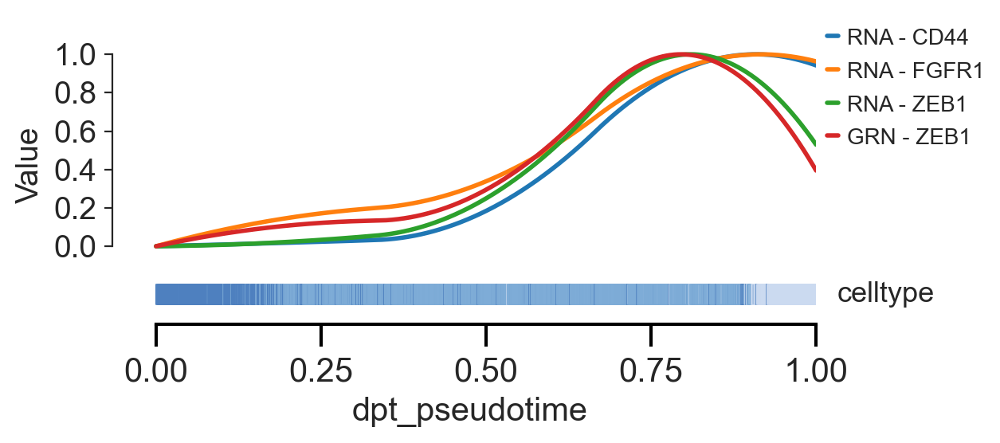

<Axes: xlabel='dpt_pseudotime', ylabel='Value'>

In [256]:
scm.pl.trendplot(
    gdata,
    var_dict = {
        "CD44": ["RNA"],
        "FGFR1": ["RNA"],
        "ZEB1": ["RNA", "GRN"]
    },
    normalize = True,
    sortby = "dpt_pseudotime",
    col_color = ["celltype"],
    figsize=(6.5, 3),
    n_splines=5,
    show_tkey=False,
    swap_x=False,
    show_stds=False,
)

## Save the data